<a href="https://colab.research.google.com/github/sergioGarcia91/ML_Carolina_Bays/blob/main/03c_Plot_Dataset_h5_256x256.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

This notebook aims to load and visualize the data stored in HDF5 (.h5) files.

# Start

In [ ]:
import numpy as np
import os
import time
import matplotlib.pyplot as plt
import h5py

from IPython.display import clear_output

In [ ]:
# Connect to Google Drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Funtions

## get_rgb

In [ ]:
def get_rgb(tif):
  rgb_image = np.dstack((tif[3],
                         tif[2],
                         tif[1]))
  return rgb_image


## normalize

In [ ]:
def normalize(img, min_percent=2, max_percent=98):
  # Adjusts the image contrast using percentiles.
  p_min, p_max = np.percentile(img, (min_percent, max_percent))
  return np.clip((img - p_min) / (p_max - p_min), 0, 1)


# Path h5

In [ ]:
path_save_h5 = '/content/drive/MyDrive/UIS/Doctorado_UIS2198589/1_semestre/TopicosAvanzadosGeofisica/FC_CarolinaBais/Dataset_h5'

h5_file = os.listdir(path_save_h5)
h5_file

['dataset_AOI_01_32x32.h5',
 'dataset_AOI_02_32x32.h5',
 'dataset_AOI_03_32x32.h5',
 'dataset_AOI_04_32x32.h5',
 'dataset_AOI_02_64x64.h5',
 'dataset_AOI_01_64x64.h5',
 'dataset_AOI_03_64x64.h5',
 'dataset_AOI_04_64x64.h5',
 'dataset_AOI_02_256x256.h5',
 'dataset_AOI_03_256x256.h5',
 'dataset_AOI_04_256x256.h5',
 'dataset_AOI_01_256x256.h5']

## F1

In [ ]:
# read file 1
#f1 = h5py.File(os.path.join(path_save_h5, h5_file[0]), 'r')
f1 = h5py.File(os.path.join(path_save_h5, 'dataset_AOI_01_256x256.h5'), 'r')
f1

<HDF5 file "dataset_AOI_01_256x256.h5" (mode r)>

In [ ]:
f1.attrs

<Attributes of HDF5 object at 139849792059040>

In [ ]:
f1.keys()

<KeysViewHDF5 ['AOI_01_FC_percentaje', 'AOI_01_X', 'AOI_01_y']>

In [ ]:
f1['AOI_01_X'].shape

(15120, 7, 256, 256)

In [ ]:
f1['AOI_01_X'].shape

(15120, 7, 256, 256)

In [ ]:
f1['AOI_01_X'][25:30].shape

(5, 7, 256, 256)

In [ ]:
datos = np.array(f1['AOI_01_X'][25:30])
datos_reformateados = datos.transpose(0, 2, 3, 1).reshape(-1, 7)

In [ ]:
datos.transpose(0, 2, 3, 1).shape

(5, 256, 256, 7)

In [ ]:
datos.transpose(0, 2, 3, 1)[0][0][0]

array([0.0120525, 0.0172225, 0.03848  , 0.0261875, 0.274705 , 0.1078625,
       0.049535 ], dtype=float32)

In [ ]:
datos_reformateados.shape

(327680, 7)

Image 0


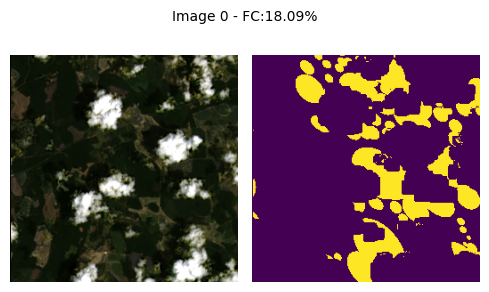



Image 500


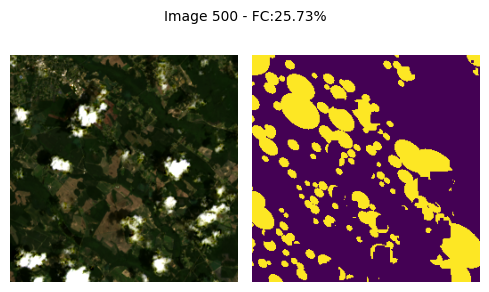



Image 1000


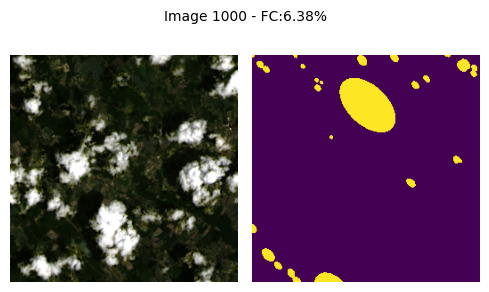



Image 1500


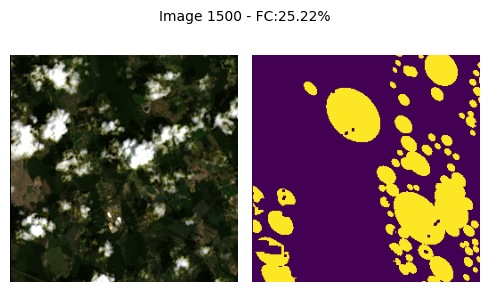



Image 2000


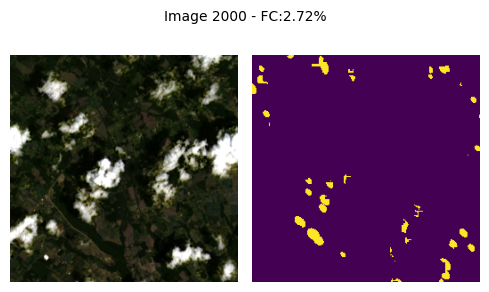



Image 2500


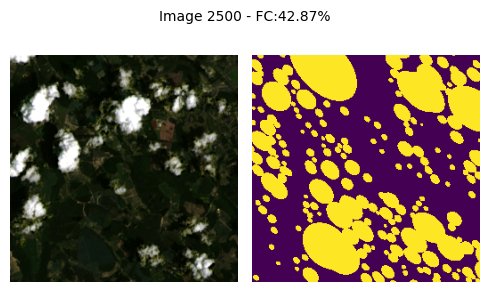



Image 3000


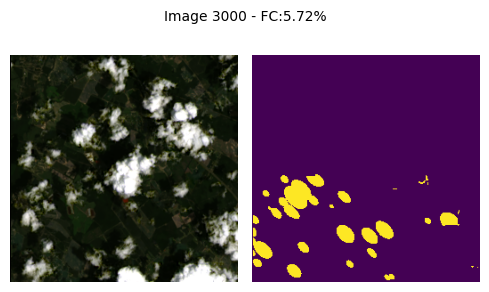



Image 3500


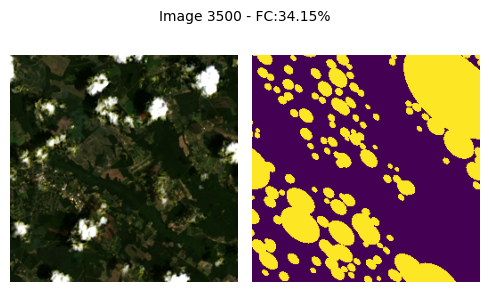



Image 4000


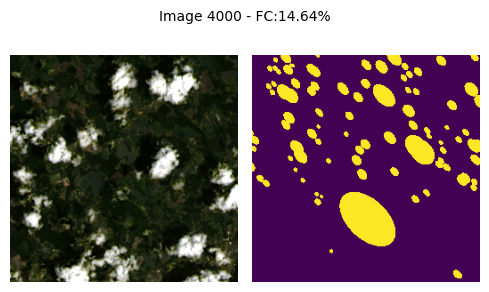



Image 4500


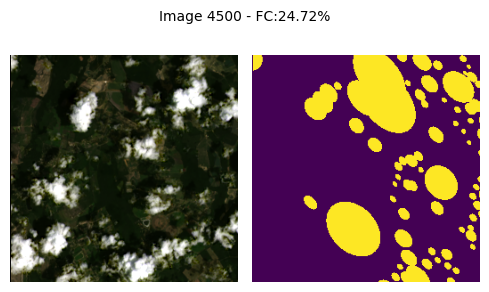



Image 5000


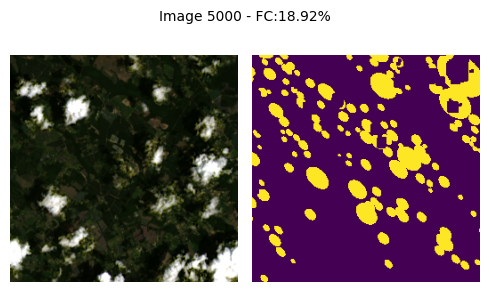



Image 5500


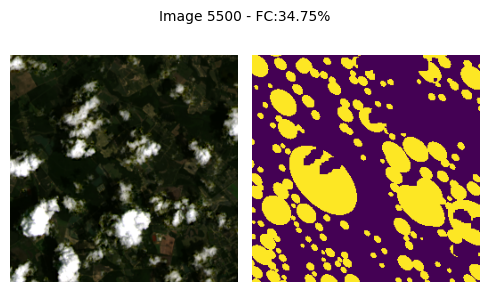



Image 6000


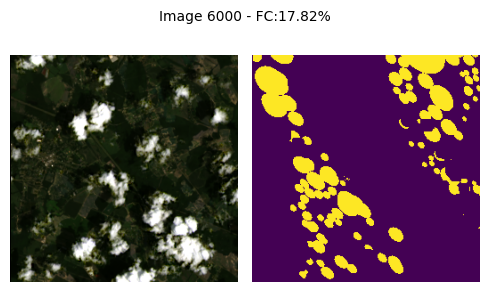



Image 6500


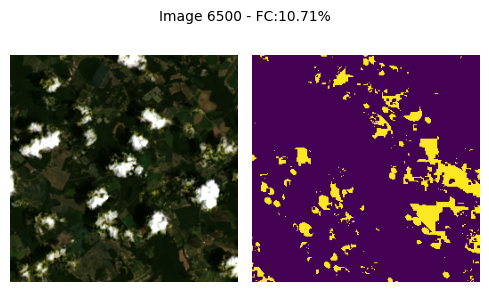



Image 7000


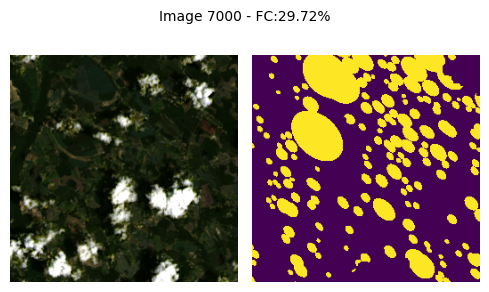



Image 7500


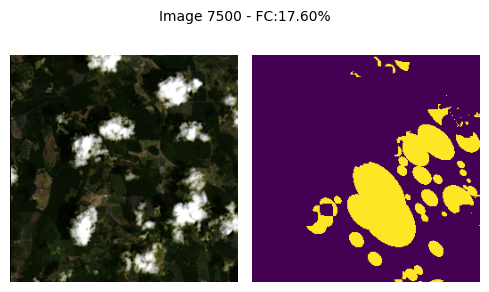



Image 8000


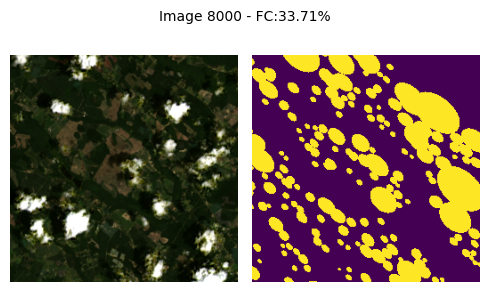



Image 8500


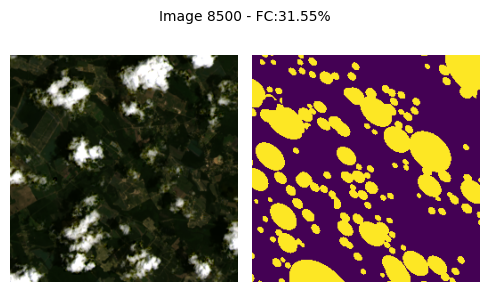



Image 9000


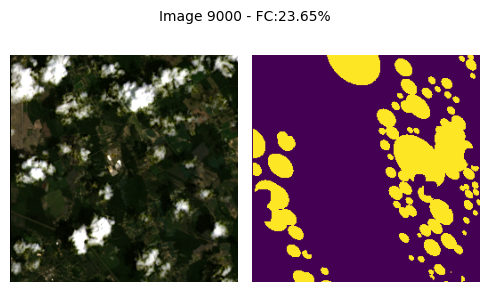



Image 9500


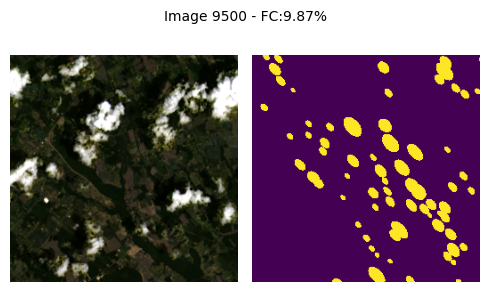



Image 10000


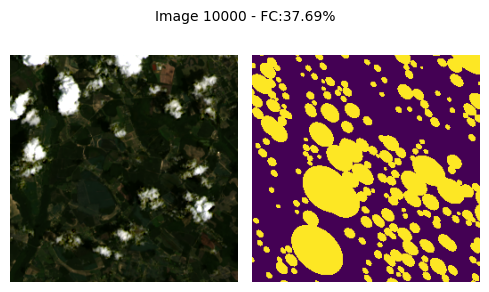



Image 10500


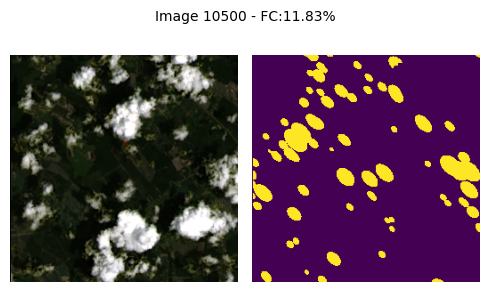



Image 11000


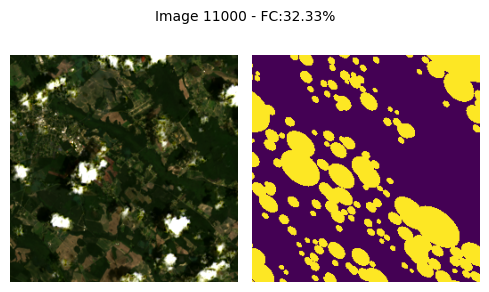



Image 11500


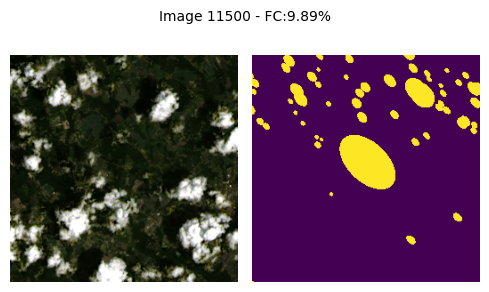



Image 12000


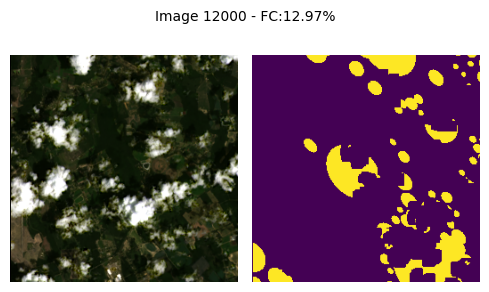



Image 12500


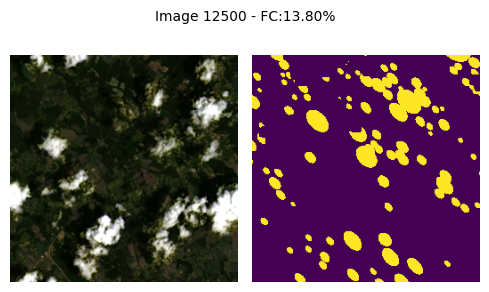



Image 13000


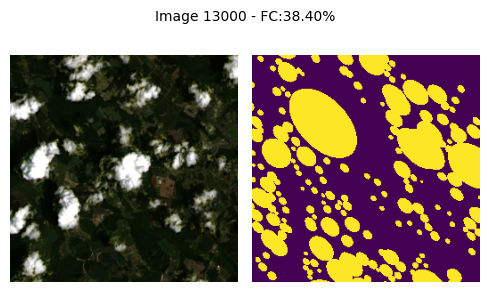



Image 13500


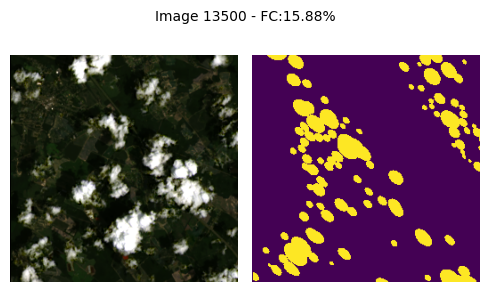



Image 14000


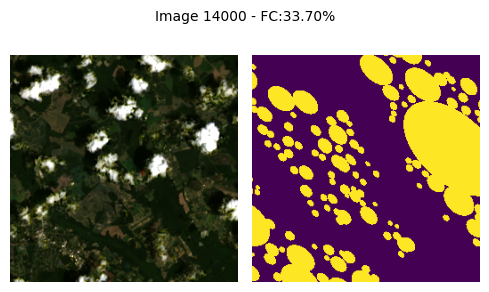



Image 14500


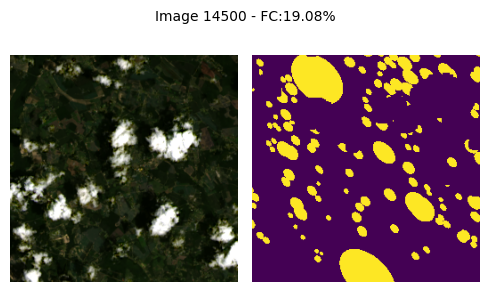



Image 15000


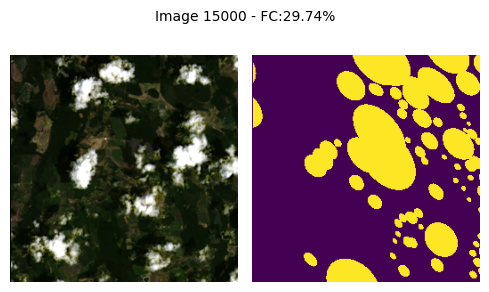

In [ ]:
imgs_of_interests = np.arange(0, f1['AOI_01_X'].shape[0], 500)

for img_interest in imgs_of_interests:
  print(f'Image {img_interest}')
  X_ = f1['AOI_01_X'][img_interest]
  Y_ = f1['AOI_01_y'][img_interest]
  P_ = f1['AOI_01_FC_percentaje'][img_interest]

  fig, ax = plt.subplots(figsize=(5, 3), nrows=1, ncols=2)
  ax[0].imshow(normalize(get_rgb(X_)))  # Apply normalization
  ax[0].axis('off')
  ax[1].imshow(Y_, vmin=0, vmax=1)
  ax[1].axis('off')

  plt.suptitle(f'Image {img_interest} - FC:{P_:.2f}%', fontsize=10)
  plt.tight_layout()
  plt.show()
  print('\n')


## F2

In [ ]:
# read file 2
#f2 = h5py.File(os.path.join(path_save_h5, h5_file[1]), 'r')
f2 = h5py.File(os.path.join(path_save_h5, 'dataset_AOI_02_256x256.h5'), 'r')
f2

<HDF5 file "dataset_AOI_02_256x256.h5" (mode r)>

In [ ]:
f2['AOI_02_X'].shape

(15120, 7, 256, 256)

Image 0


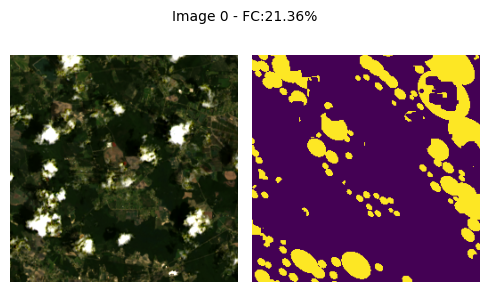



Image 500


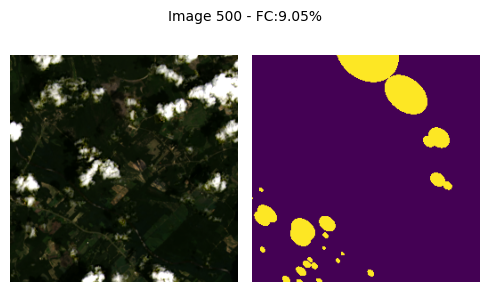



Image 1000


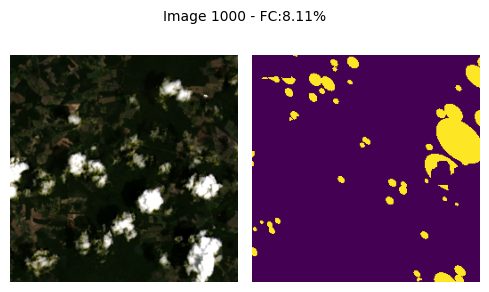



Image 1500


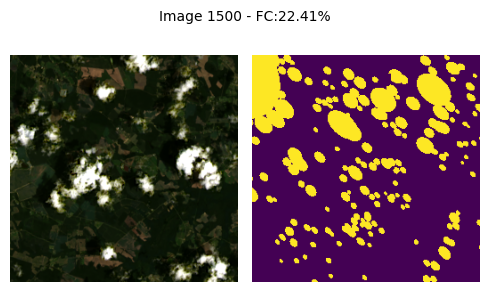



Image 2000


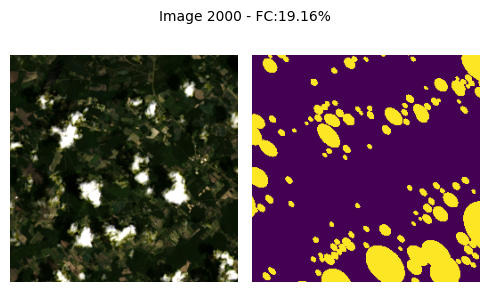



Image 2500


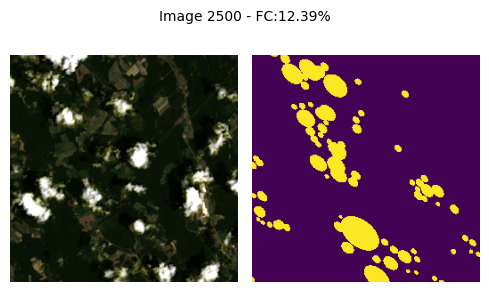



Image 3000


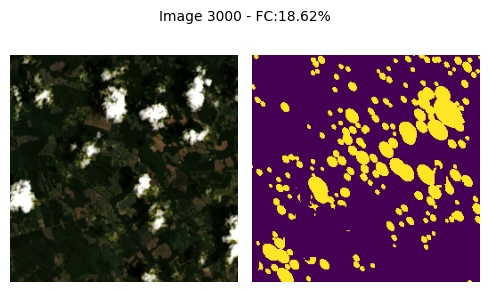



Image 3500


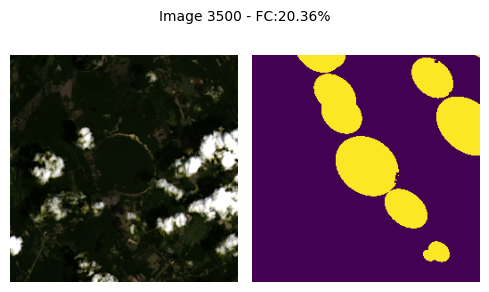



Image 4000


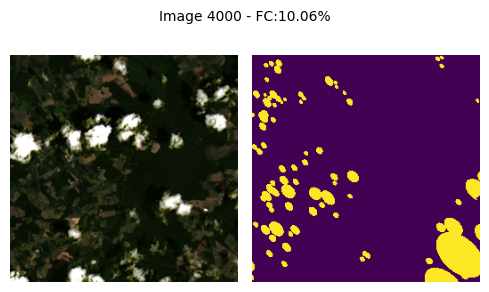



Image 4500


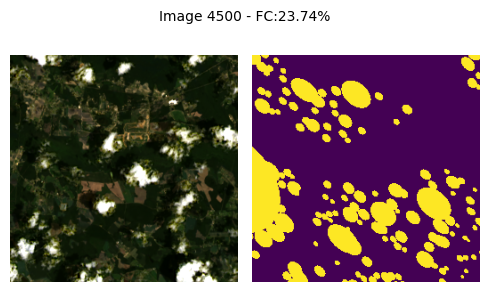



Image 5000


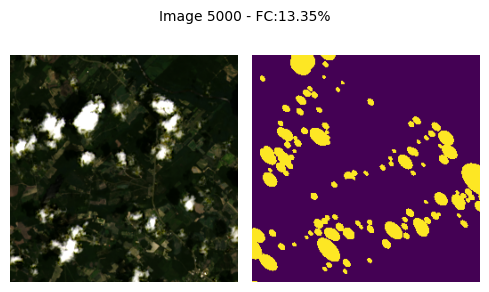



Image 5500


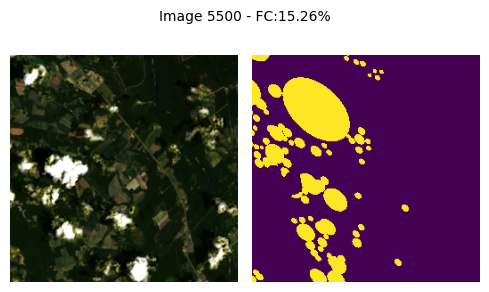



Image 6000


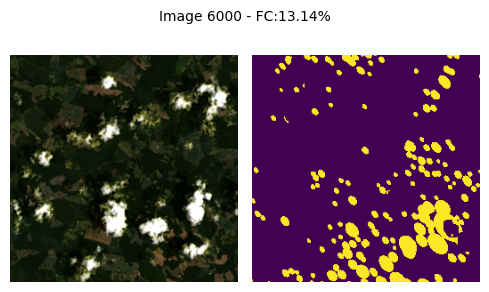



Image 6500


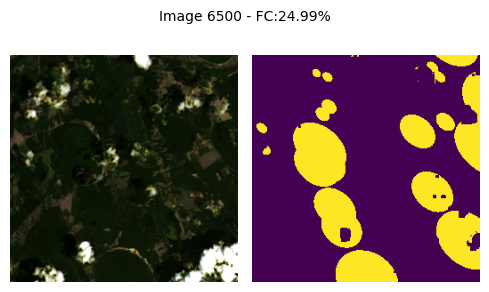



Image 7000


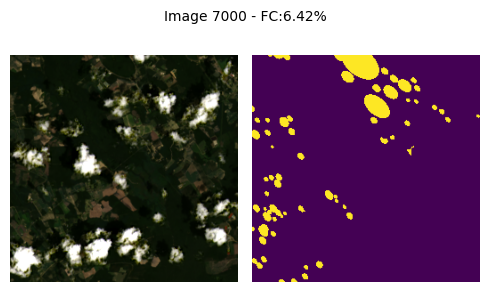



Image 7500


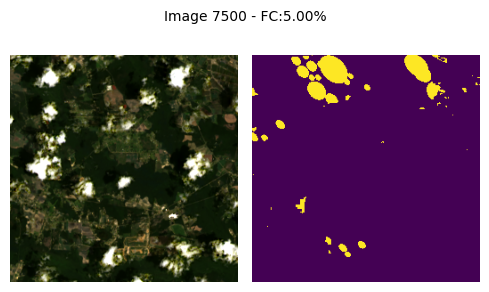



Image 8000


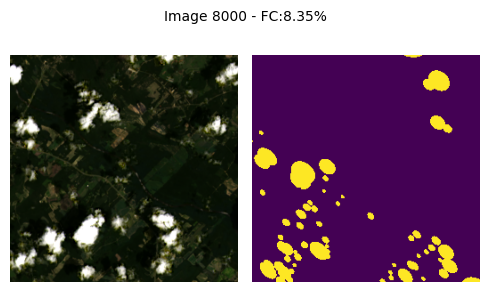



Image 8500


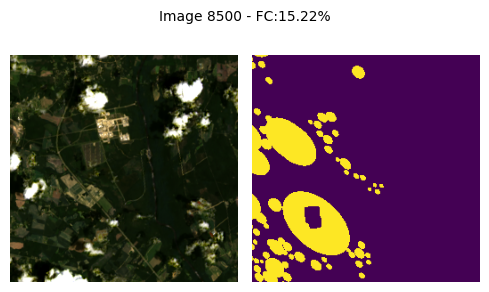



Image 9000


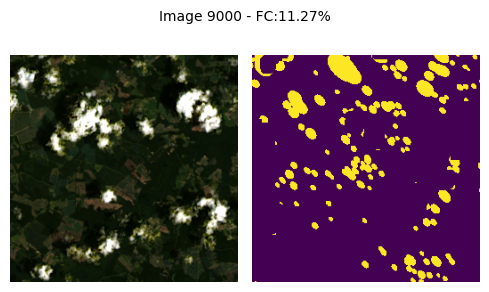



Image 9500


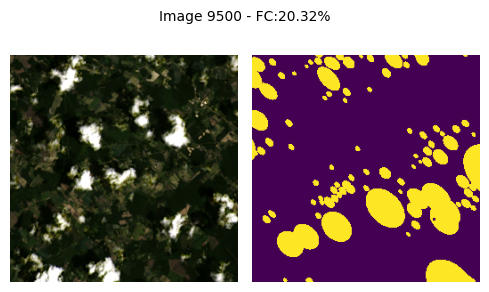



Image 10000


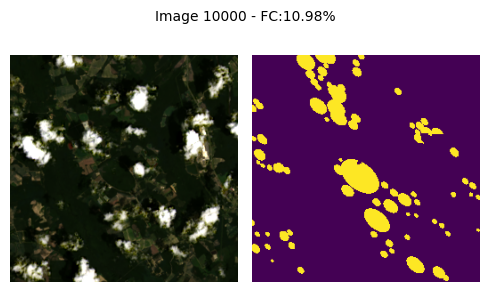



Image 10500


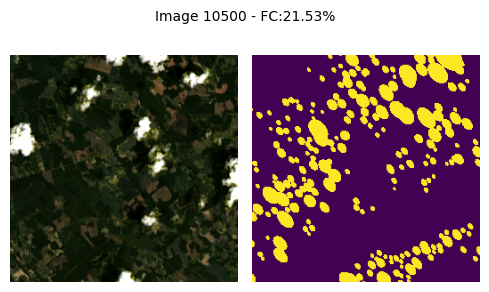



Image 11000


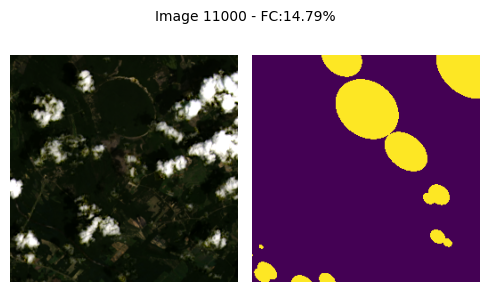



Image 11500


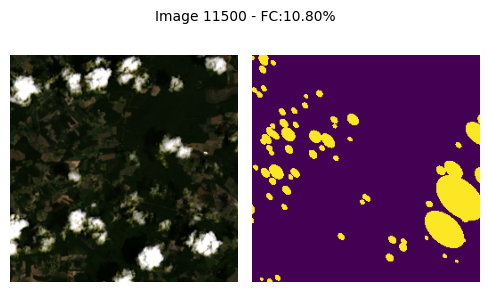



Image 12000


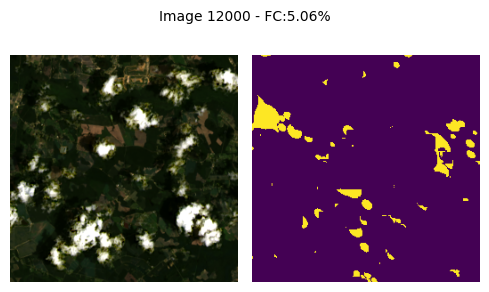



Image 12500


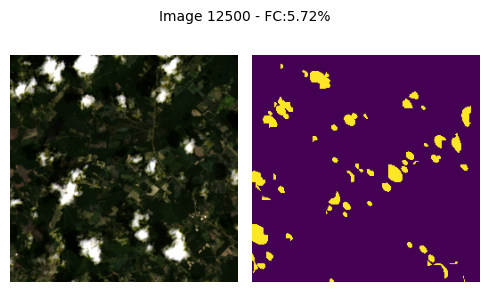



Image 13000


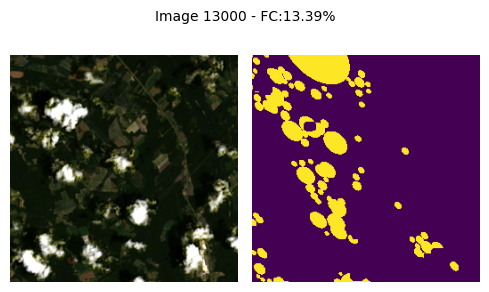



Image 13500


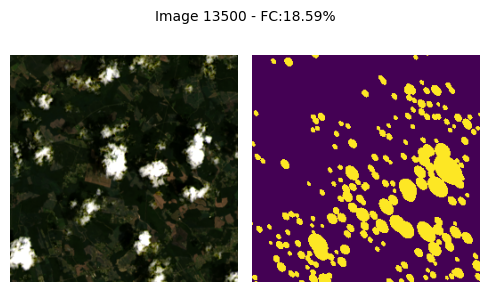



Image 14000


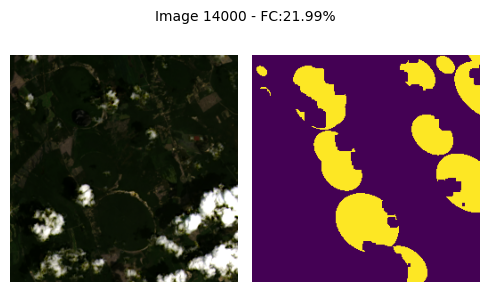



Image 14500


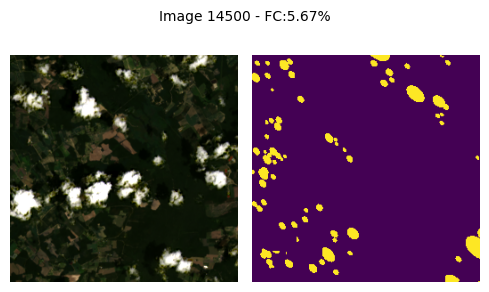



Image 15000


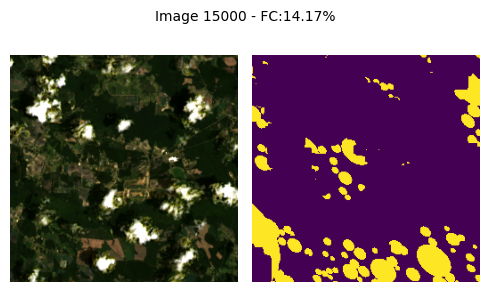

In [ ]:
imgs_of_interests = np.arange(0, f2['AOI_02_X'].shape[0], 500)

for img_interest in imgs_of_interests:
  print(f'Image {img_interest}')
  X_ = f2['AOI_02_X'][img_interest]
  Y_ = f2['AOI_02_y'][img_interest]
  P_ = f2['AOI_02_FC_percentaje'][img_interest]

  fig, ax = plt.subplots(figsize=(5, 3), nrows=1, ncols=2)
  ax[0].imshow(normalize(get_rgb(X_)))  # Apply normalization
  ax[0].axis('off')
  ax[1].imshow(Y_, vmin=0, vmax=1)
  ax[1].axis('off')

  plt.suptitle(f'Image {img_interest} - FC:{P_:.2f}%', fontsize=10)
  plt.tight_layout()
  plt.show()
  print('\n')

## F3

In [ ]:
# read file 3
#f3 = h5py.File(os.path.join(path_save_h5, h5_file[2]), 'r')
f3 = h5py.File(os.path.join(path_save_h5, 'dataset_AOI_03_256x256.h5'), 'r')
f3

<HDF5 file "dataset_AOI_03_256x256.h5" (mode r)>

In [ ]:
f3['AOI_03_X'].shape

(15120, 7, 256, 256)

Image 0


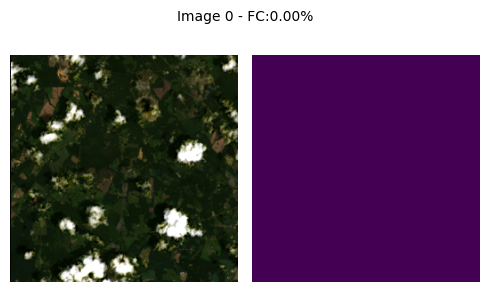



Image 500


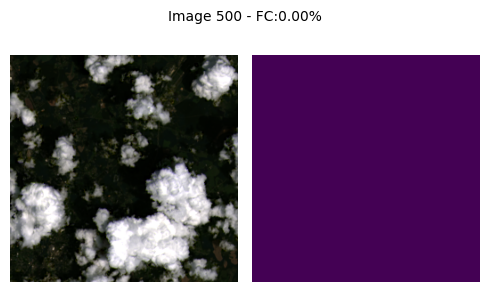



Image 1000


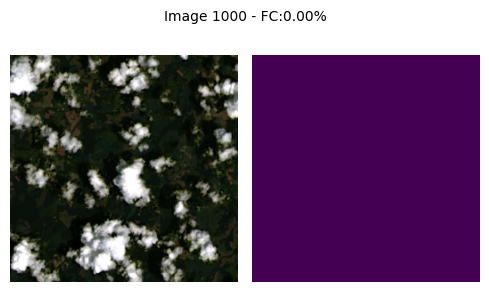



Image 1500


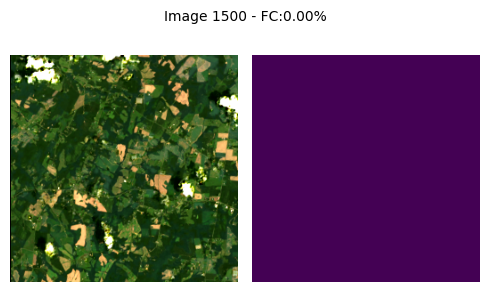



Image 2000


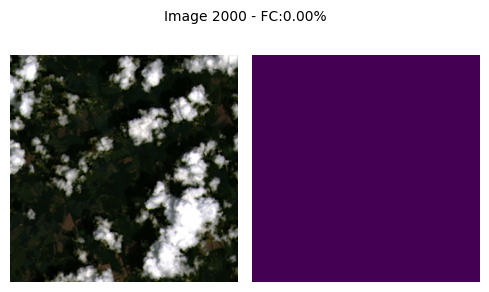



Image 2500


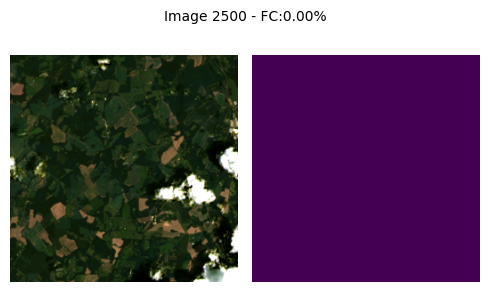



Image 3000


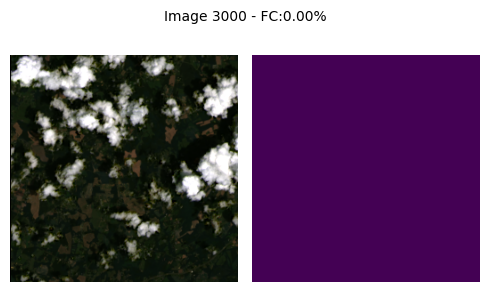



Image 3500


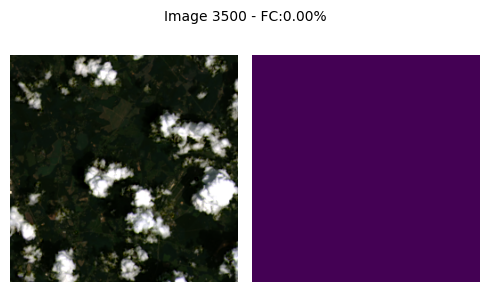



Image 4000


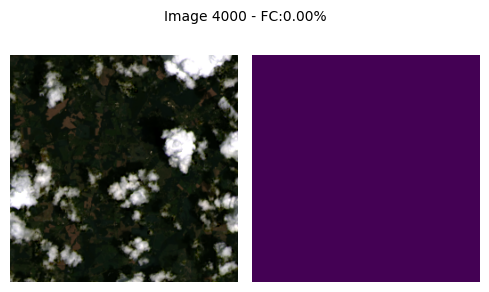



Image 4500


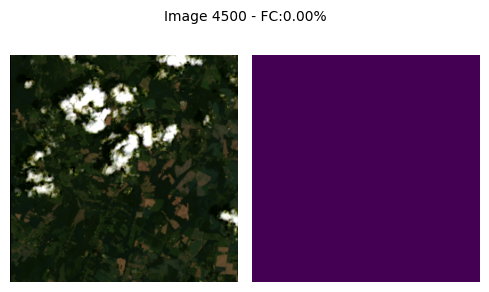



Image 5000


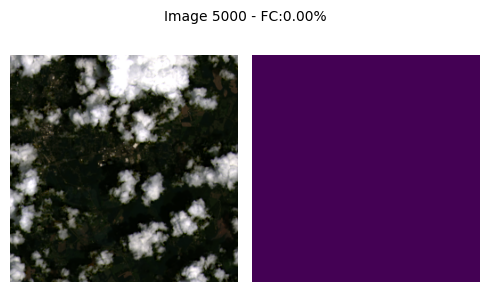



Image 5500


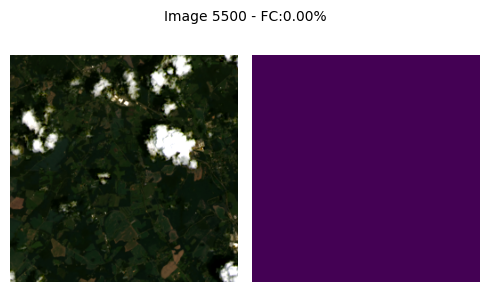



Image 6000


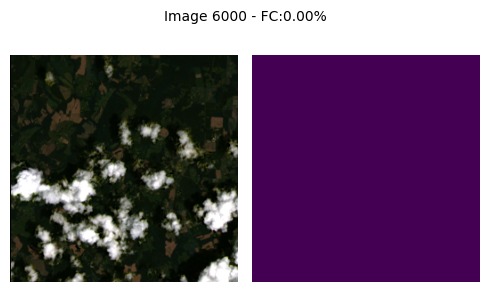



Image 6500


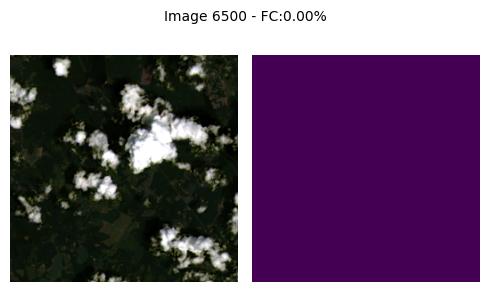



Image 7000


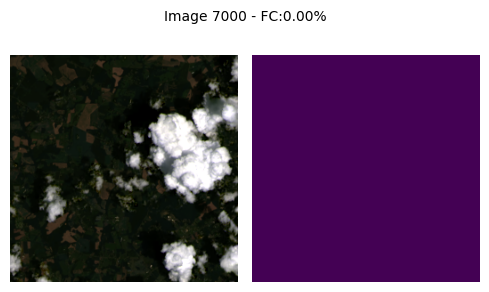



Image 7500


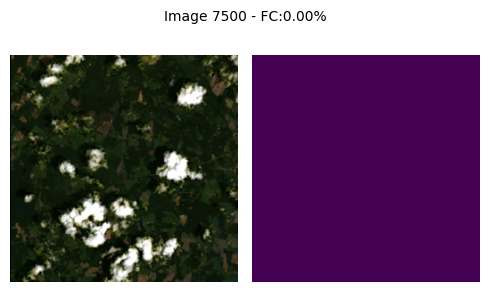



Image 8000


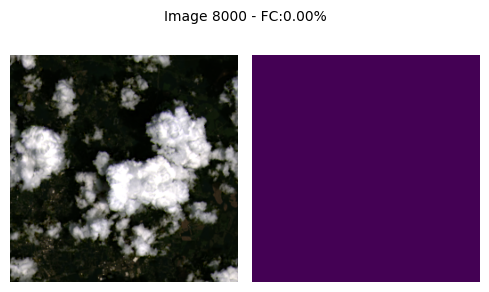



Image 8500


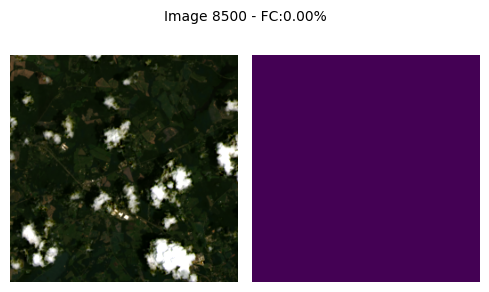



Image 9000


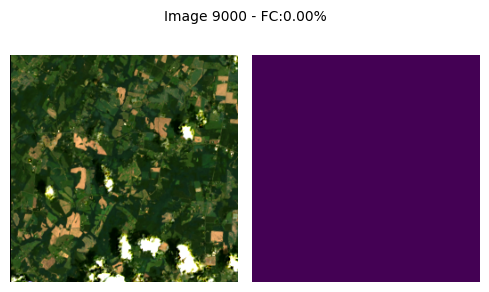



Image 9500


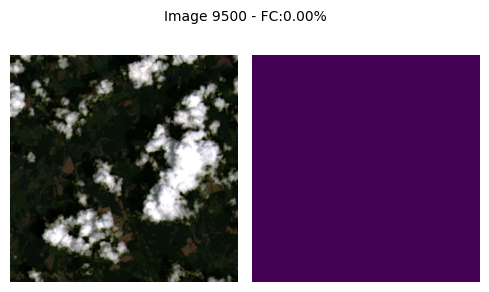



Image 10000


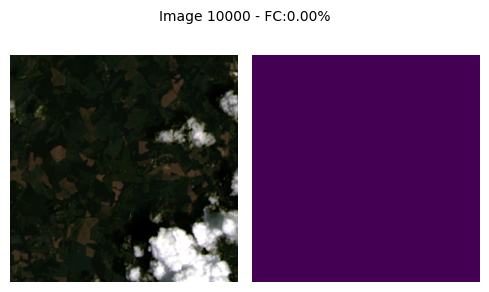



Image 10500


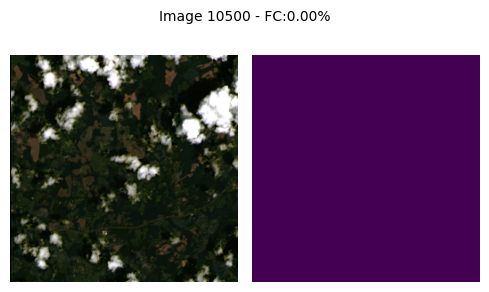



Image 11000


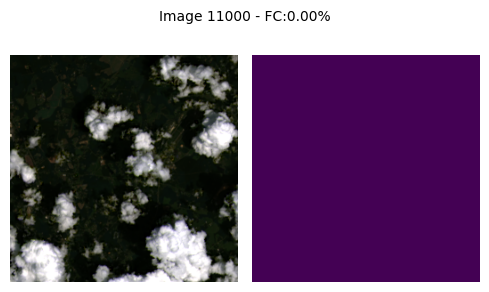



Image 11500


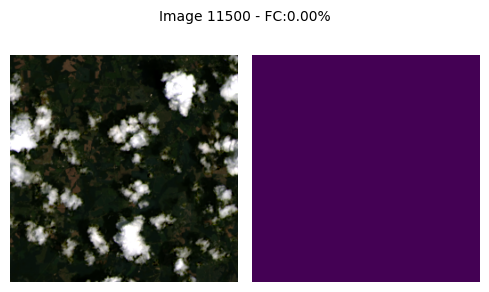



Image 12000


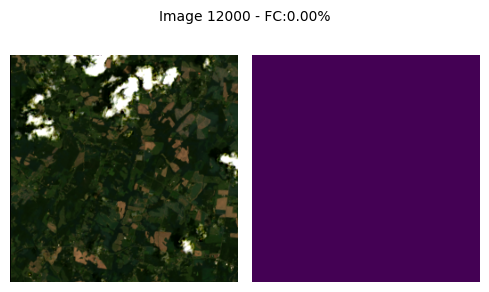



Image 12500


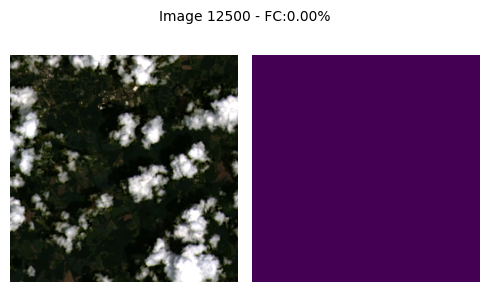



Image 13000


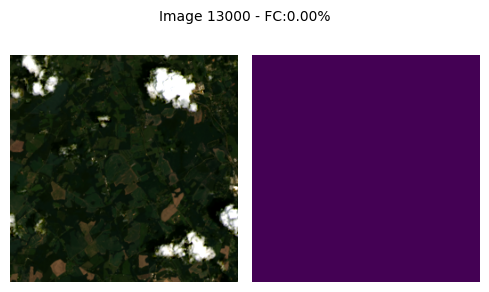



Image 13500


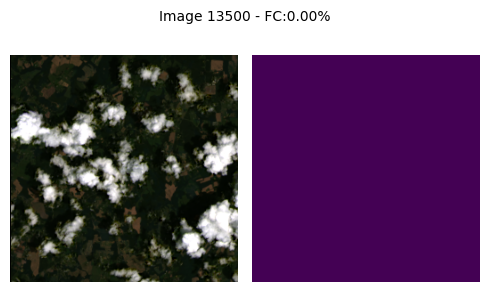



Image 14000


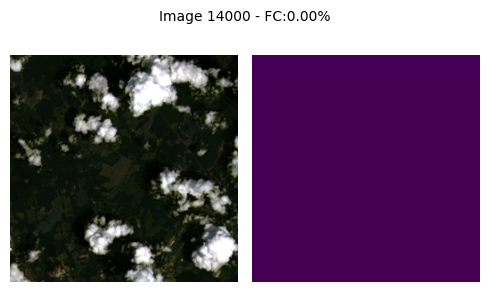



Image 14500


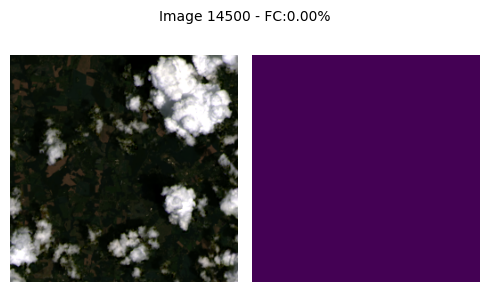



Image 15000


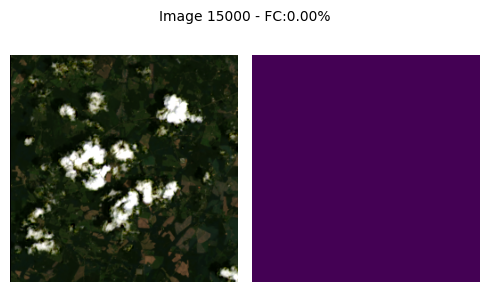

In [ ]:
imgs_of_interests = np.arange(0, f3['AOI_03_X'].shape[0], 500)

for img_interest in imgs_of_interests:
  print(f'Image {img_interest}')
  X_ = f3['AOI_03_X'][img_interest]
  Y_ = f3['AOI_03_y'][img_interest]
  P_ = f3['AOI_03_FC_percentaje'][img_interest]

  fig, ax = plt.subplots(figsize=(5, 3), nrows=1, ncols=2)
  ax[0].imshow(normalize(get_rgb(X_)))  # Apply normalization
  ax[0].axis('off')
  ax[1].imshow(Y_, vmin=0, vmax=1)
  ax[1].axis('off')

  plt.suptitle(f'Image {img_interest} - FC:{P_:.2f}%', fontsize=10)
  plt.tight_layout()
  plt.show()
  print('\n')

## F4

In [ ]:
# read file 4
#f4 = h5py.File(os.path.join(path_save_h5, h5_file[3]), 'r')
f4 = h5py.File(os.path.join(path_save_h5, 'dataset_AOI_04_256x256.h5'), 'r')
f4

<HDF5 file "dataset_AOI_04_256x256.h5" (mode r)>

In [ ]:
f4['AOI_04_X'].shape

(15120, 7, 256, 256)

Image 0


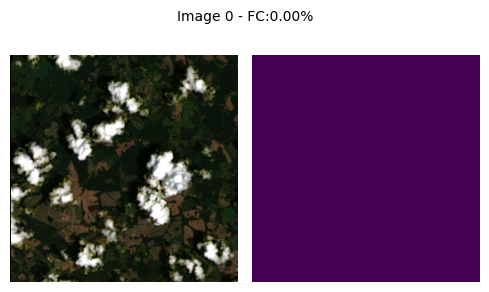



Image 500


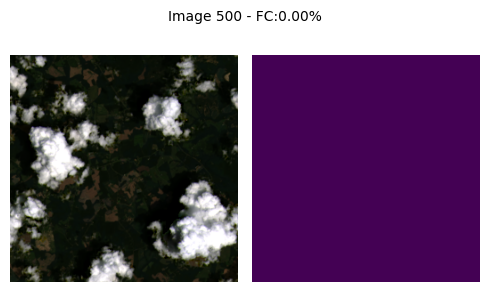



Image 1000


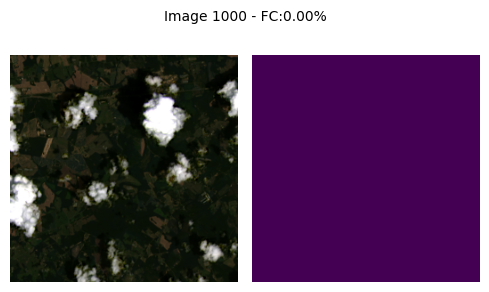



Image 1500


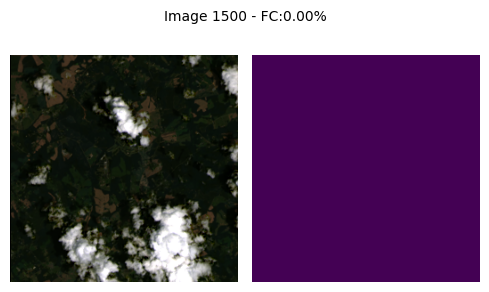



Image 2000


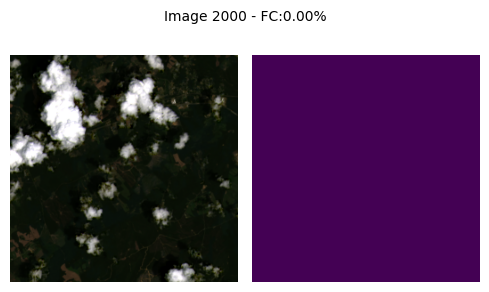



Image 2500


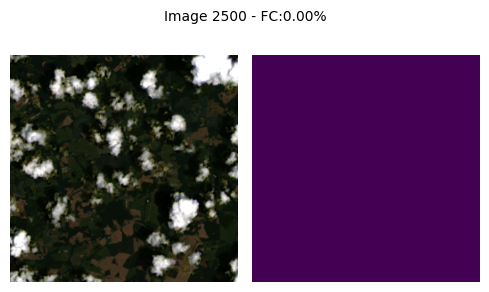



Image 3000


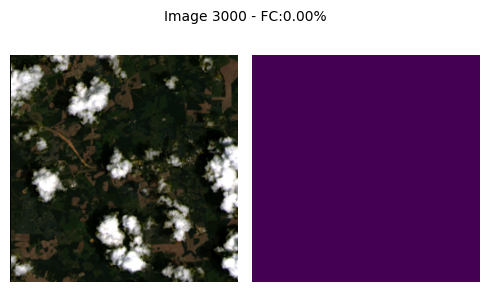



Image 3500


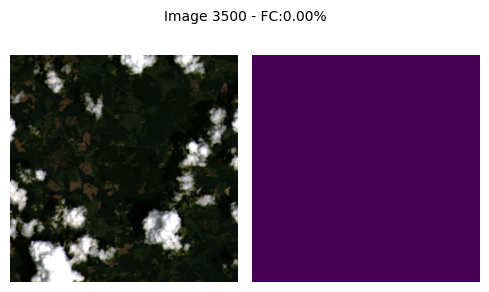



Image 4000


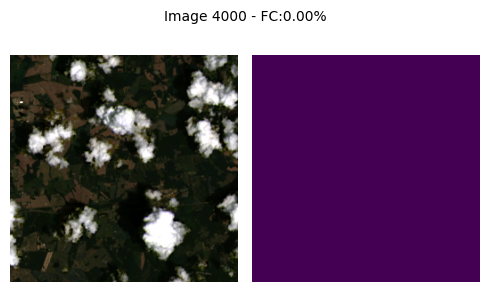



Image 4500


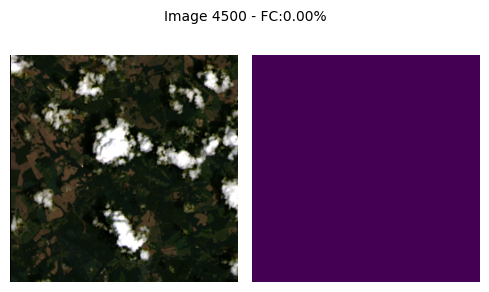



Image 5000


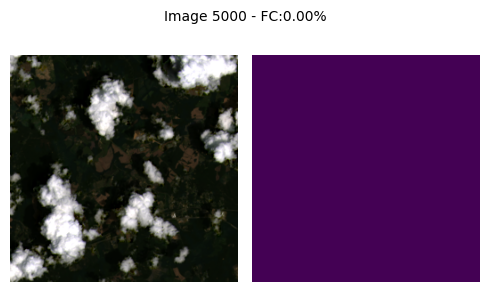



Image 5500


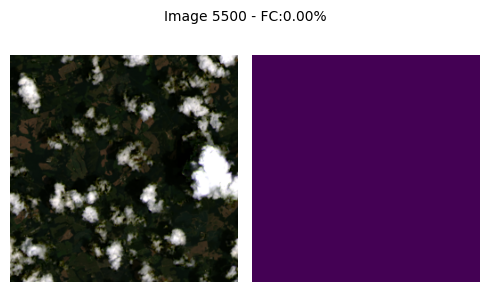



Image 6000


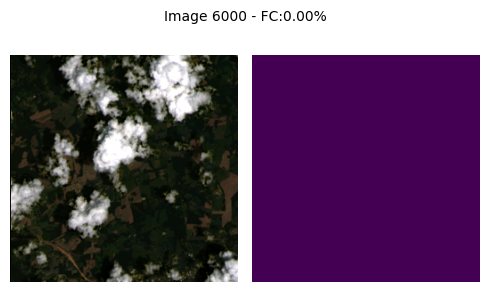



Image 6500


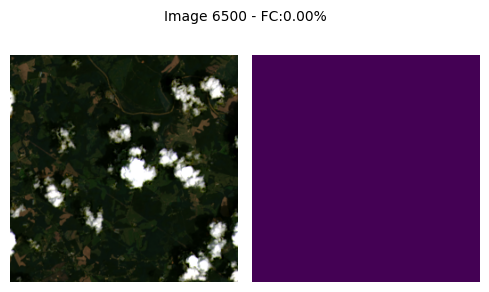



Image 7000


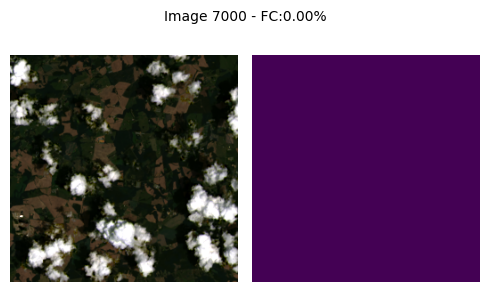



Image 7500


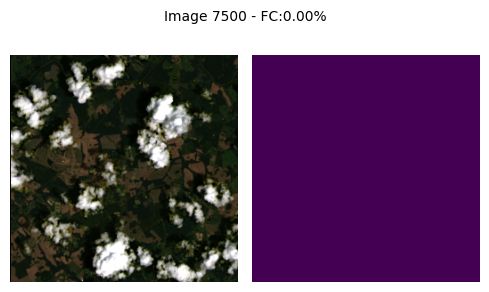



Image 8000


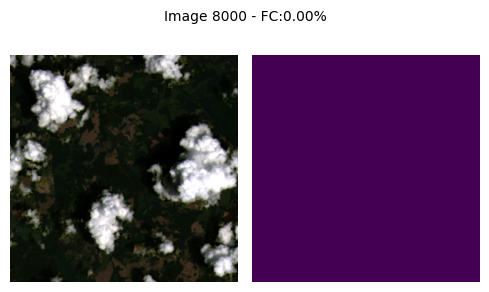



Image 8500


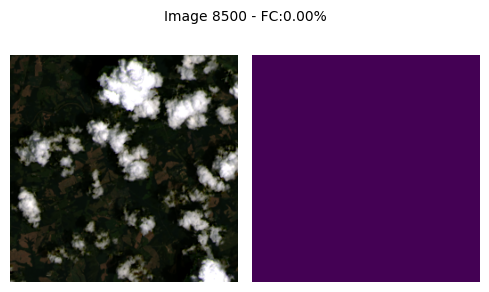



Image 9000


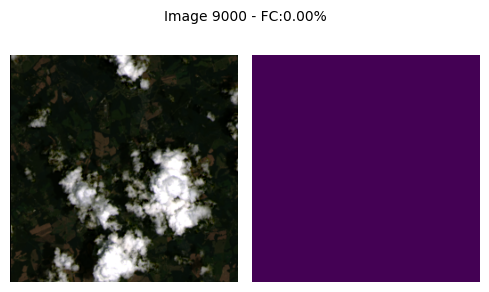



Image 9500


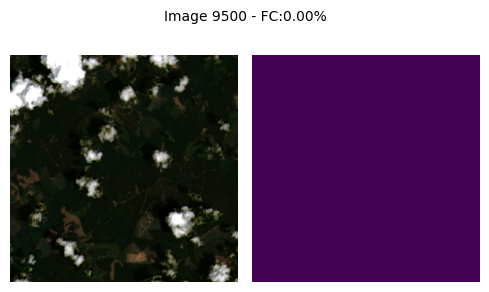



Image 10000


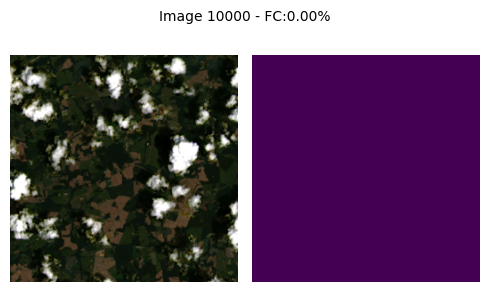



Image 10500


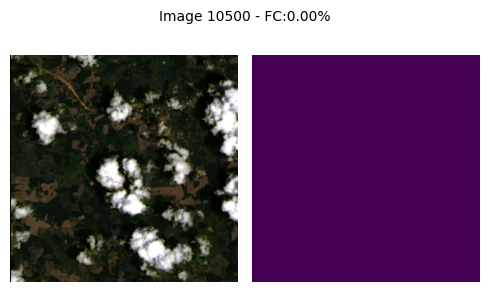



Image 11000


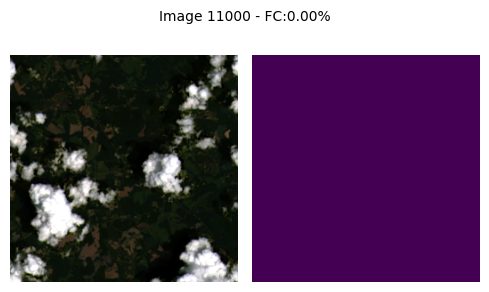



Image 11500


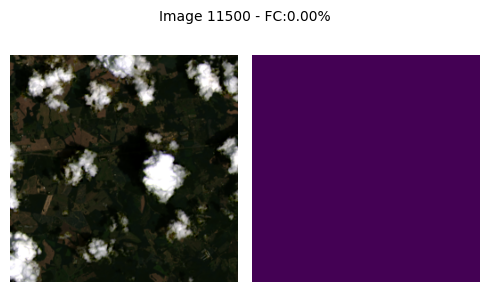



Image 12000


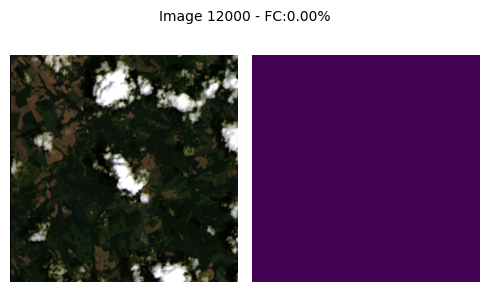



Image 12500


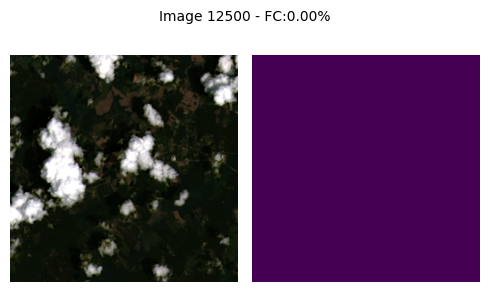



Image 13000


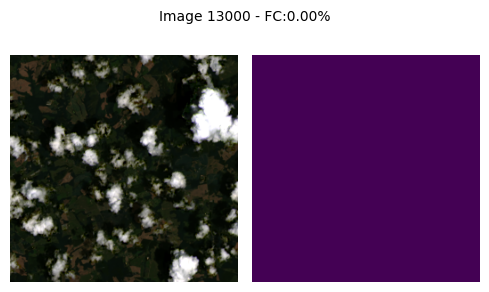



Image 13500


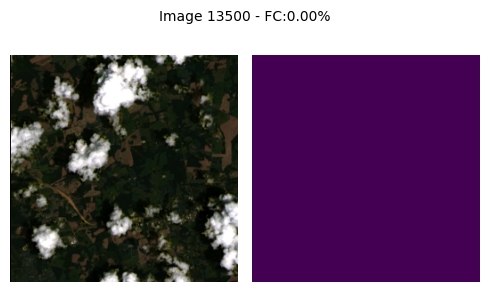



Image 14000


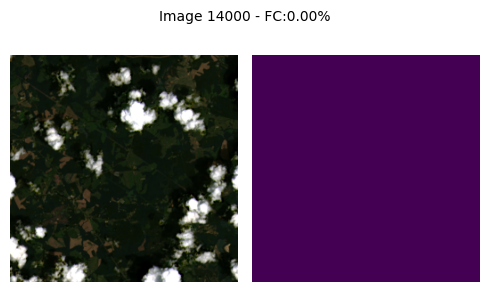



Image 14500


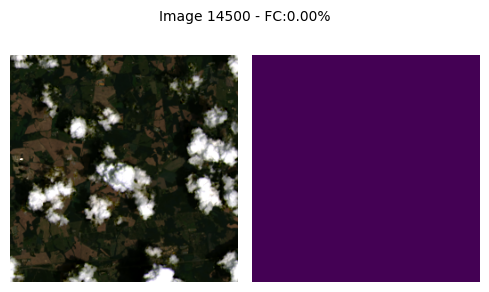



Image 15000


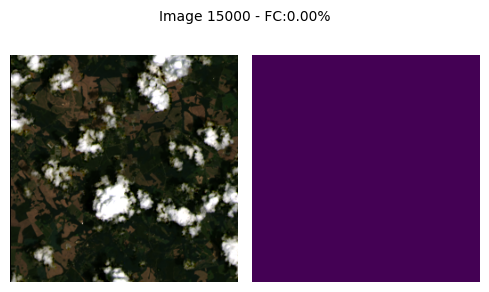

In [ ]:
imgs_of_interests = np.arange(0, f4['AOI_04_X'].shape[0], 500)

for img_interest in imgs_of_interests:
  print(f'Image {img_interest}')
  X_ = f4['AOI_04_X'][img_interest]
  Y_ = f4['AOI_04_y'][img_interest]
  P_ = f4['AOI_04_FC_percentaje'][img_interest]

  fig, ax = plt.subplots(figsize=(5, 3), nrows=1, ncols=2)
  ax[0].imshow(normalize(get_rgb(X_)))  # Apply normalization
  ax[0].axis('off')
  ax[1].imshow(Y_, vmin=0, vmax=1)
  ax[1].axis('off')

  plt.suptitle(f'Image {img_interest} - FC:{P_:.2f}%', fontsize=10)
  plt.tight_layout()
  plt.show()
  print('\n')


# End